In [ ]:
# Notebook to demonstrate image stacking for 
#...smartphone astrophotography
# Written by Riley Troyer Fall 2019 for PhysCon 2019

# Some Information About me...
## Currently 2nd year grad student at University of Iowa studying auroral physics
## From Fairbanks, Alaska where I did my undergrad in physics
## Heavily involved in SPS
### -was president of UAF chapter, helped bring first Alaska group to PhysCon in 2016
### -was national SPS intern through the Mather Science Policy Internship
### - have organized multiple public astronomy events
## Interested in combining accessible technology with science.



In [1]:
# Import libraries

# General utility/science/arrays
import numpy as np
# Operating system and files
import os
# Image processing
from skimage import io, exposure
from skimage.restoration import denoise_nl_means, estimate_sigma
# Plotting
from matplotlib import pyplot as plt
%matplotlib inline

# Define directories
dark_directory = 'Photos/Milkyway 2 -nightcap/Dark Frame/'
light_directory = 'Photos/Milkyway 2 -nightcap/Light Frame/'

# Astrophotography with a Smartphone
## Major Issues
### - Limited stock camera control
### - Limited electronic exposure times
### - Small sensor size, very noise in the dark
## Solutions
### - App that allows more camera controls, I recommend Moment -Pro Camera (IOS and Android) or NightCap (IOS). 
### - Take multiple (10+) photos with longest possible exposure, do same while covering lens
### - Average light and dark photos together and post process
# -----------------------------------------------------

# Functions to average and process the images

In [6]:
def average_images(image_directory, image_names):
    """Function to average a number of images stored in the 
    specified directory
    INPUT
    image_directory - string: where the images are stored
    image_names - array (string): list of all the image names
    OUTPUT
    averaged_array - array (float): averaged image array
    """
    # Create an empty array to store averaged array in
    temp_image = io.imread(image_directory + image_names[0])
    size = temp_image.shape
    averaged_array = np.zeros(size)

    # Loop through each file
    for n, image_name in enumerate(image_names):
        file = image_directory + image_name
        image_array = io.imread(file)

        # Add array values to average array
        averaged_array = averaged_array + image_array

    # Divide summed array to get average
    averaged_array = averaged_array/n

    return averaged_array

def smartphone_image_stack(light_directory, dark_directory, 
                           dark_frame = True, single_image = False,
                           denoise = True, weight = 10, 
                           boost_contrast=True, low = 30, high = 99.95,
                           gray = False, 
                           save_fig = False, file_name = 'test.png',
                           dpi = 1000):
    """Function to stack a series of photographs of the night sky
    taken with a smartphone. This allows the final image to be
    significantly less noisy.
    INPUT
    light_directory, dark_directory - string: directories where the
                                                light and dark frames 
                                                are stored.
    dark_frame - True/False: If true subtract dark frame from light, 
                             which can reduce noise even further.
    single_image - True/False: If true only use a single image, this 
                               is used as an example.
    denoise - True/False: If true use non-local means denoising.
    weight - float: How strong the denoising should be. Higher is more.
    boost_constrast - True/False: If true rescale the image intensity.
    low - float: Percent of pixels below this will be darkest value. 
    high - float: Percent of pixels above this will be lightest value.
    gray - True/False: If true convert the image to grayscale.
    save_fig - True/False: If true save the figure.
    file_name - string: Name of saved figure.
    dpi - int: Resolution of saved image.
    OUTPUT
    none
    """
    # Get names of the files in the directory ommiting hidden files
    #...which start with '.'
    dark_files = [f for f in os.listdir(dark_directory) 
                  if not f.startswith('.')]
    light_files = [f for f in os.listdir(light_directory) 
                   if not f.startswith('.')]
    # If specified use only a single image for testing/example purposes
    if single_image == True:
        averaged_light = io.imread(light_directory + light_files[0])
    # Otherwise average the light frames
    else:
        averaged_light = average_images(light_directory, light_files)
        print('The light images have been averaged')
    
    # Average dark frames and subtract from light if specified
    if dark_frame == True:
        averaged_dark = average_images(dark_directory, dark_files)
        image = averaged_light - averaged_dark
        
        # Account for possibly less than 0 values
        image[image < 0] = 0
        
        print('The dark images have been averaged and subtracted.')
        
    else:
        image = averaged_light
    
    # If specified denoise image using non-local means
    if denoise == True:
        # Estimate the sigma of the image for noise
        sigma_est = np.mean(estimate_sigma(image, multichannel=True))
        
        # Keywords to specify the patch size for the denoise algorithm
        patch_kw = dict(patch_size=5, 
                        patch_distance=6, multichannel=True)
        
        image = denoise_nl_means(image, h=weight*sigma_est, 
                                 sigma=sigma_est,
                                 fast_mode=True,
                                 **patch_kw)
        
        print('The images have been denoised.')
    
    # If specified boost constrast
    if boost_contrast == True:
        v_min, v_max = np.percentile(image, (low, high))
        image = exposure.rescale_intensity(image, 
                                           in_range=(v_min, v_max))
        
        print('The image contrast has been boosted.')
    
    
    # If specified convert to grayscale
    if gray == True:
        
        def rgb2gray(rgb):
            """Function to convert rgb image into grayscale"""
            r, g, b = rgb[:,:,0], rgb[:,:,1], rgb[:,:,2]
            gray = 0.2989*r + 0.5870*g + 0.1140*b
            return gray
        
        image = rgb2gray(image)
        
        print('The image has been converted to grayscale')
    
    # Create the image plot
    plt.figure(figsize=(20,20))
    
    if gray == True:
        plt.imshow(image, cmap='gray')
    else:
        plt.imshow(image)
    
    plt.axis('off')
    plt.tight_layout()
    
    # If specified save the figure
    if save_fig == True:
        plt.savefig(file_name, dpi=dpi)
        
        ('The image has been saved.')

# What does a single photo look like?
## - Taken with NightCap app on iPhone XR
## - 1 sec (max) exposure
## - 10,000 ISO (basically countrate sensitivity)

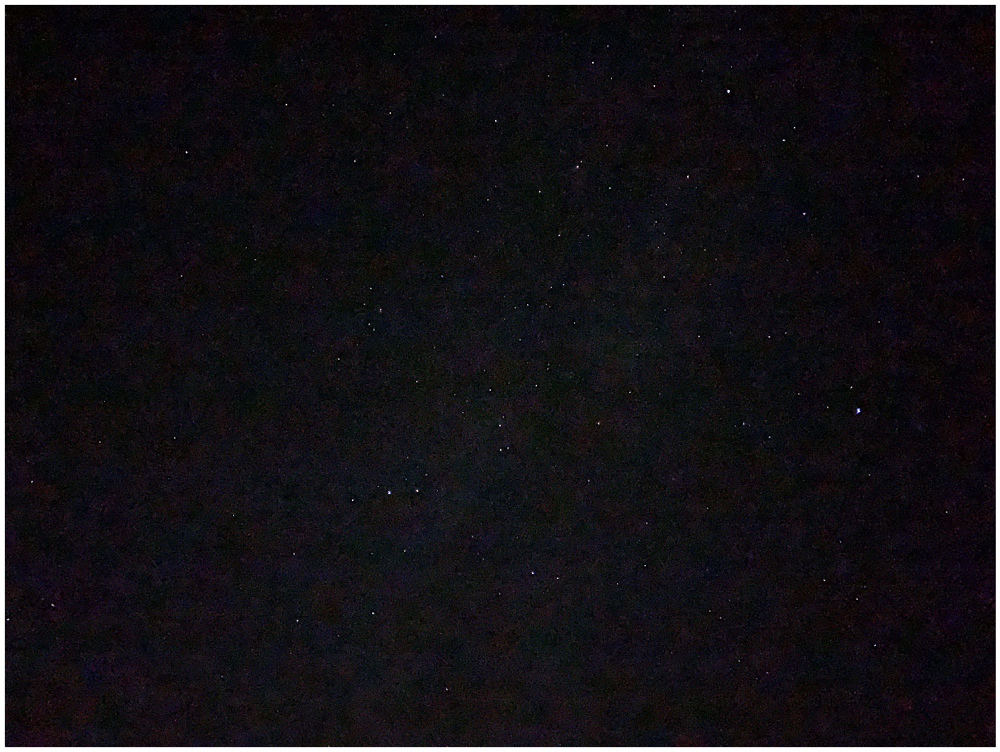

In [7]:
smartphone_image_stack(light_directory, dark_directory, 
                       dark_frame = False, 
                       single_image = True,
                       denoise = False, 
                       boost_contrast=False,
                       gray = False, 
                       save_fig = False)

# Okay...this is better than an "auto" photo, but it's still pretty dark. What happens if we try to denoise and increase the contrast?

The images have been denoised.
The image contrast has been boosted.


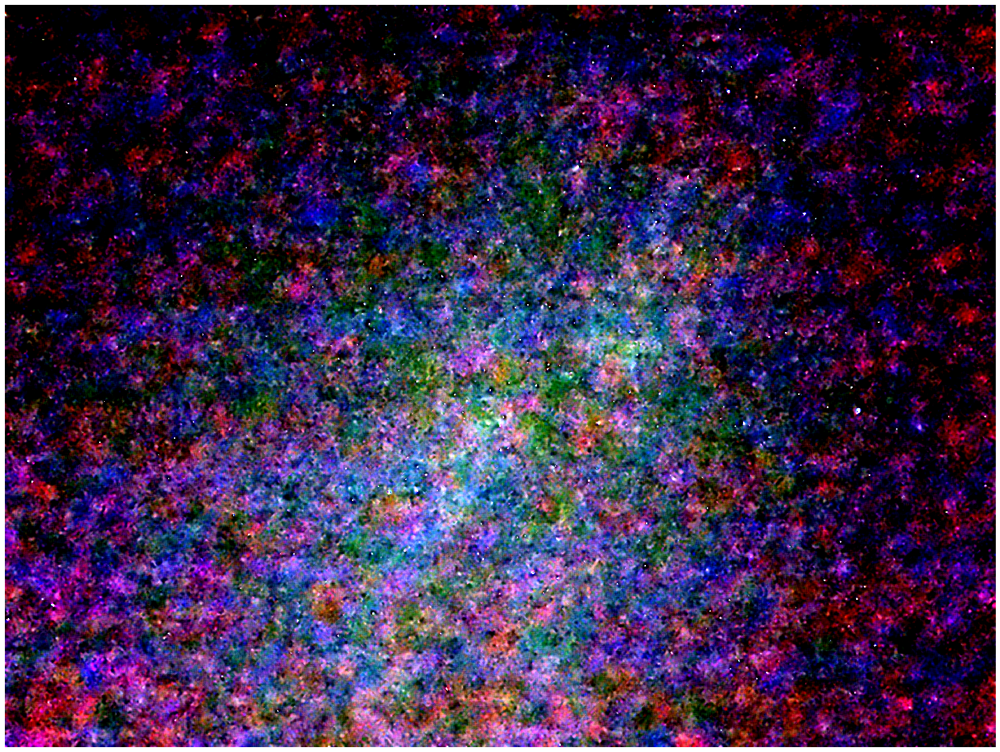

In [8]:
smartphone_image_stack(light_directory, dark_directory, 
                       dark_frame = False, 
                       single_image = True,
                       denoise = True, weight = 10, 
                       boost_contrast=True, low = 30, high = 99.5,
                       gray = False, 
                       save_fig = False)

# Wow! That looks terrible! Now lets try using all the images we have and average them together

The light images have been averaged
The dark images have been averaged and subtracted.
The images have been denoised.
The image contrast has been boosted.


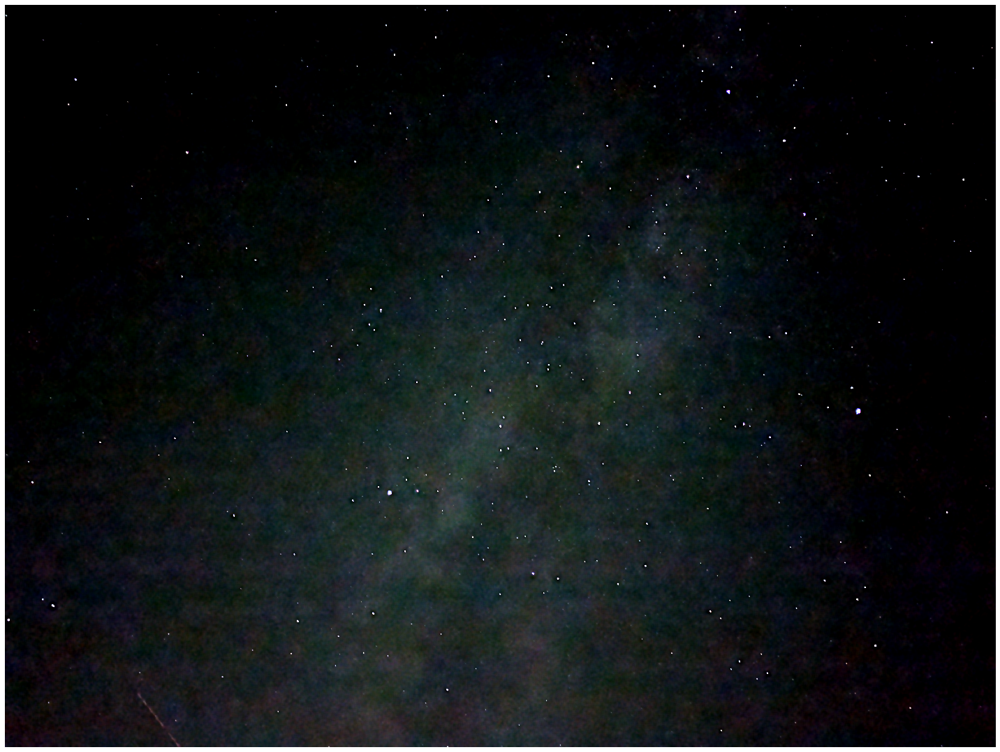

In [9]:
smartphone_image_stack(light_directory, dark_directory, 
                       dark_frame = True, single_image = False,
                       denoise = True, weight = 10, 
                       boost_contrast=True, low = 30, high = 99.95,
                       gray = False)

# Tips for taking these images
## - Get an app that allows more camera controls
NightCap (IOS): https://www.nightcapcamera.com

Moment (IOS, Android): https://www.shopmoment.com/moment-pro-camera-app
## - Use tripod with smartphone adapter
Tripod: https://www.amazon.com/AmazonBasics-60-Inch-Lightweight-Tripod-Bag/dp/B005KP473Q/ref=sxin_2_ac_d_rm?ac_md=3-3-dHJpcG9k-ac_d_rm&keywords=smartphone+tripod&pd_rd_i=B005KP473Q&pd_rd_r=acbb0277-bce9-4266-9a65-78312397e86a&pd_rd_w=lPTSU&pd_rd_wg=DSeUT&pf_rd_p=39892eb5-25ed-41d8-aff1-b659c9b73760&pf_rd_r=T2QF4MD2BHJ2YZWKPX1S&psc=1&qid=1573142157

Adapter: https://www.amazon.com/Vastar-Universal-Smartphone-Horizontal-Adjustable/dp/B01L3B5PBI/ref=sxin_2_ac_d_rm?ac_md=2-2-c21hcnRwaG9uZSB0cmlwb2QgbW91bnQ%3D-ac_d_rm&keywords=smartphone+tripod&pd_rd_i=B01L3B5PBI&pd_rd_r=acbb0277-bce9-4266-9a65-78312397e86a&pd_rd_w=lPTSU&pd_rd_wg=DSeUT&pf_rd_p=39892eb5-25ed-41d8-aff1-b659c9b73760&pf_rd_r=T2QF4MD2BHJ2YZWKPX1S&psc=1&qid=1573142157
## - Use headphones with volume rocker to remotely trigger shutter